# Data Preprocessing and applying BERT model with word clouds
- As there are multiple languages in my df this will create some problems with preprocessing
- Language detection
- BERT model applied (https://huggingface.co/nlptown/bert-base-multilingual-uncased-sentiment)
- some quick EDA to be explored more
- stop words removal and lemmatisation for word clouds
- word clouds


In [1]:
import pandas as pd
from langdetect import detect
from tqdm import tqdm
tqdm.pandas()

In [2]:
reviews_df = pd.read_csv('review_data/clean_data.csv')
reviews_df

,name,rating,author_title,review_text,review_rating,date
0,Lost Weekend,4.4,Lucas Gahn,Das Café ist super und sehr Stilvoll eingerich...,5.0,09/10/2023
1,Lost Weekend,4.4,Susanne Kosch,Und jetzt mal halblang. Könnte auch ein Motto ...,5.0,09/10/2023
2,Lost Weekend,4.4,sahar sajedi,Wässriger Kaffee. Nichts für nicht Veganer.,2.0,04/10/2023
3,Lost Weekend,4.4,Canberk,Great place to study all day and drink some go...,5.0,28/09/2023
4,Lost Weekend,4.4,Trang Nguyen,"Hmm, tôi đã đặt spezi và một chiếc brezelc khô...",4.0,26/09/2023
...,...,...,...,...,...,...
3151,Dinatale Cafe,4.7,Vincent Vogt,Dolce Vita at its best. A must stop for coffee..!,5.0,16/06/2019
3152,Dinatale Cafe,4.7,Vaiva Tepe,Very good cappuccino!,5.0,16/06/2019
3153,Dinatale Cafe,4.7,Andy Baumann,"Einfach herrlich "",italienisch"" ...",5.0,10/06/2019
3154,Dinatale Cafe,4.7,Stephan Holzinger,👍🏼☕️,5.0,08/06/2019


In [3]:
#  a function to detect the language of each review and store it in a column
def detect_lang(text):
    try:
        return detect(text)
    except:
        return 'unknown'
    
reviews_df['language'] = reviews_df['review_text'].apply(detect_lang)

In [4]:
reviews_df['language'].value_counts()

language
de         1814
en         1032
fr           45
it           44
es           38
ru           15
af           14
ro           13
id           10
ko           10
no           10
da           10
unknown       8
nl            8
et            8
pl            7
pt            6
tr            6
sv            5
ca            5
so            4
hr            4
fi            4
uk            4
zh-cn         4
ar            4
sl            3
he            3
sw            3
el            3
tl            3
cs            3
hu            2
zh-tw         2
vi            1
cy            1
Name: count, dtype: int64

In [5]:
# upon inspection of the df ive noticed some incorrect detections of languages which i will correct
de_indices = [128, 416, 807, 813, 978, 1088, 1090, 1129, 1149, 1429, 2214, 2428, 2437, 2452, 2669,
                  2808, 2765, 2814, 3106]
en_indices = [63, 273, 379, 424, 459, 637, 905, 962, 969, 982, 983, 1013, 1085, 1277, 1388, 1406,
              1472, 1567, 1591, 1602, 1611, 1631, 1633, 1679, 1684, 1735, 1733, 1738, 1882, 1884,
              1914, 1973, 2038, 2183, 2437, 2848, 2936]

for id in de_indices:
    reviews_df.loc[id, 'language'] = 'de'
    
for id in en_indices:
    reviews_df.loc[id, 'language'] = 'en'

In [6]:
# With the sentiment model I will be using it specialises in German, English, Italian, French and Spanish.
# I will have to filter the data for these languages.

lang_to_keep = ['de', 'en', 'it', 'fr', 'es']

reviews_df = reviews_df[reviews_df['language'].isin(lang_to_keep)]

In [7]:
reviews_df = reviews_df.reset_index()

In [8]:
# making all text lowercase
#removing special characters not !, this will give sentiment,i noticed some issues reviewing the language column.
reviews_df['review_text'] = reviews_df['review_text'].str.lower()
reviews_df['review_text'] = reviews_df['review_text'].str.replace('[^a-zA-Z0-9 !]|\n', '')



In [9]:
reviews_df['date'] = pd.to_datetime(reviews_df['date'], format='%d/%m/%Y')

In [10]:
reviews_df

,index,name,rating,author_title,review_text,review_rating,date,language
0,0,Lost Weekend,4.4,Lucas Gahn,das café ist super und sehr stilvoll eingerich...,5.0,2023-10-09,de
1,1,Lost Weekend,4.4,Susanne Kosch,und jetzt mal halblang. könnte auch ein motto ...,5.0,2023-10-09,de
2,2,Lost Weekend,4.4,sahar sajedi,wässriger kaffee. nichts für nicht veganer.,2.0,2023-10-04,de
3,3,Lost Weekend,4.4,Canberk,great place to study all day and drink some go...,5.0,2023-09-28,en
4,5,Lost Weekend,4.4,Ella H,überfülltes studentencafe. nettes ambiente abe...,4.0,2023-09-20,de
...,...,...,...,...,...,...,...,...
3018,3150,Dinatale Cafe,4.7,Susanne S.,best coffee in town. best staff in town. simpl...,5.0,2019-06-26,en
3019,3151,Dinatale Cafe,4.7,Vincent Vogt,dolce vita at its best. a must stop for coffee..!,5.0,2019-06-16,en
3020,3152,Dinatale Cafe,4.7,Vaiva Tepe,very good cappuccino!,5.0,2019-06-16,it
3021,3153,Dinatale Cafe,4.7,Andy Baumann,"einfach herrlich "",italienisch"" ...",5.0,2019-06-10,de


In [11]:
#Saving for model use
reviews_df.to_csv('review_data/model_data.csv', index = False)

## BERT model from hugging face
- the bert model bert-base-multilingual-uncased-sentiment uses its own tokenization method
- trained in English German, French, Italian and Spanish
- no need for stop word removal or lemmatization as with Sentiment analysis, context can mean everything.

In [12]:
# Load model directly
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from scipy.special import softmax
import torch.nn.functional as F

tokenizer = AutoTokenizer.from_pretrained("nlptown/bert-base-multilingual-uncased-sentiment")
model = AutoModelForSequenceClassification.from_pretrained("nlptown/bert-base-multilingual-uncased-sentiment")

/Users/cillian/anaconda3/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
def get_sentiment(text):
    #first tokenize the text using the BERT tokenizer and return it in a format suitable for the model.
    inputs = tokenizer.encode_plus(
        text,
        return_tensors = 'pt',
        max_length = 512,
        truncation = True,
        padding = 'max_length'
    )
    
    # Get models predictions
    with torch.no_grad():
        outputs = model(**inputs)
        
    probs = F.softmax(outputs.logits, dim = -1)
    sentiment_class = torch.argmax(probs, dim = -1).item() + 1
    
    return sentiment_class

In [14]:
reviews_df['bert_ratings'] = reviews_df['review_text'].progress_apply(get_sentiment)

100%|███████████████████████████████████████| 3023/3023 [40:19<00:00,  1.25it/s]


In [15]:
#saving so i dont have to re-run model
reviews_df.to_csv('review_data/bert_data.csv', index = False)

In [16]:
reviews_df = pd.read_csv('review_data/bert_data.csv')

In [17]:
#pd.set_option('display.max_rows', None)
pd.reset_option('display.max_rows')

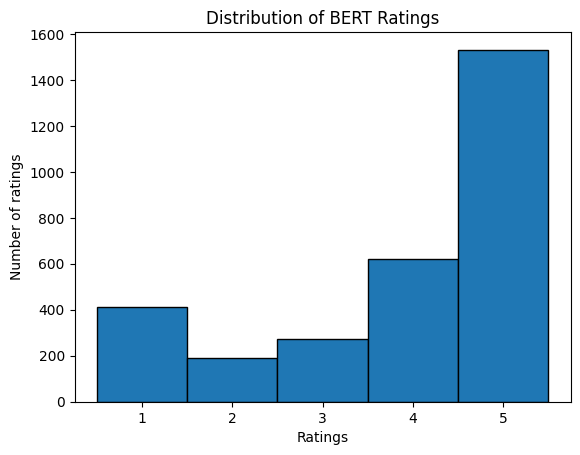

In [18]:
# visualising our results
import matplotlib.pyplot as plt
import seaborn as sns

bins = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]

plt.hist(reviews_df['bert_ratings'], bins=bins, edgecolor = 'k', align = 'mid')
plt.xticks([ 1, 2, 3, 4, 5])
plt.xlabel('Ratings')
plt.ylabel('Number of ratings')
plt.title('Distribution of BERT Ratings')
plt.show()

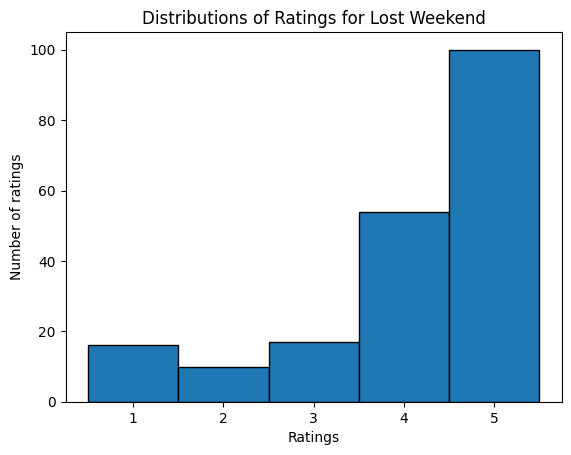

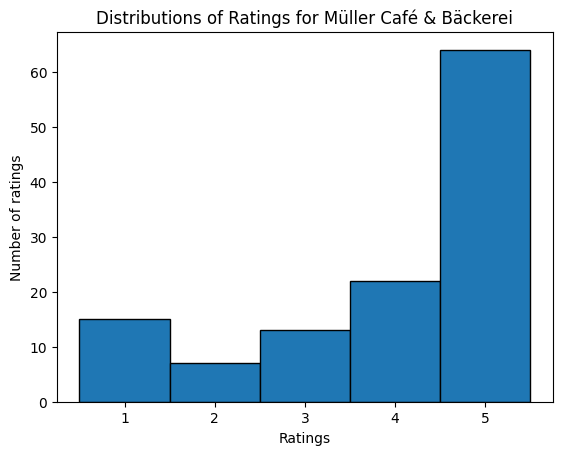

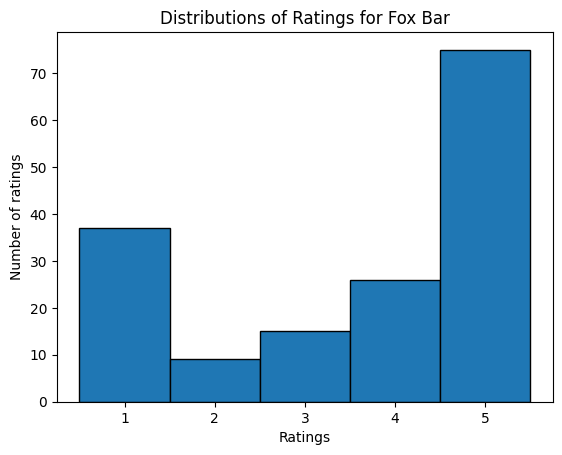

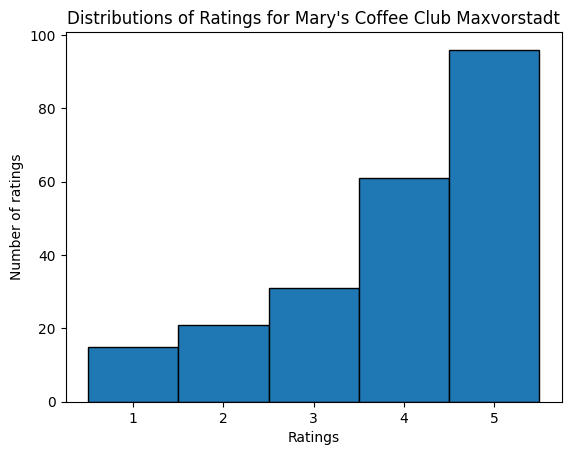

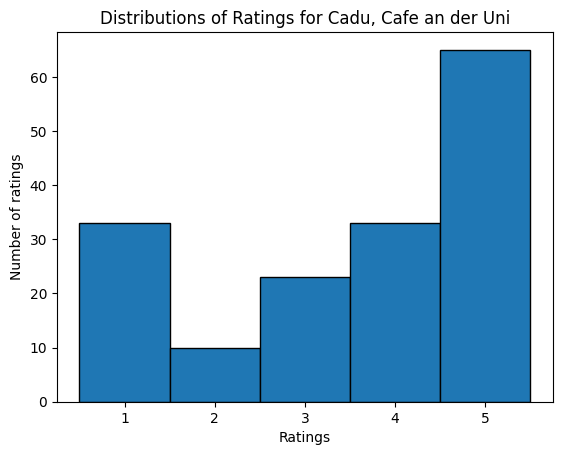

...

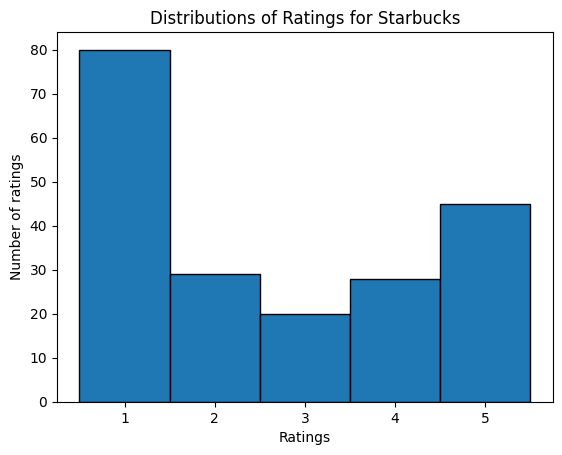

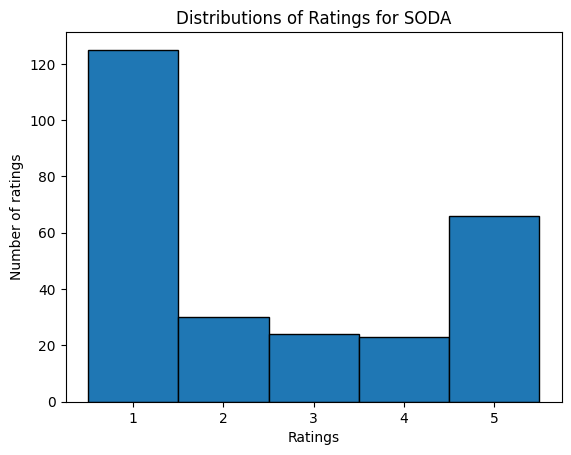

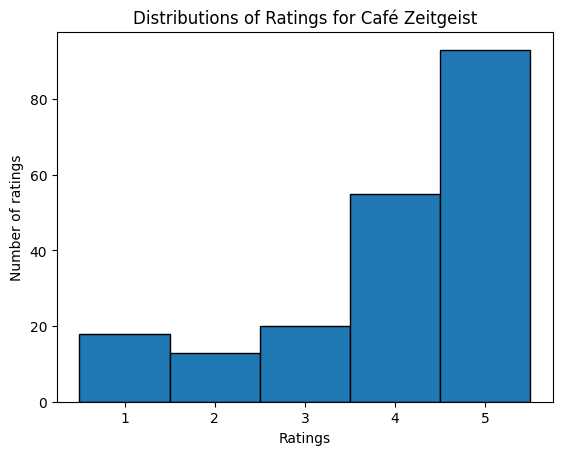

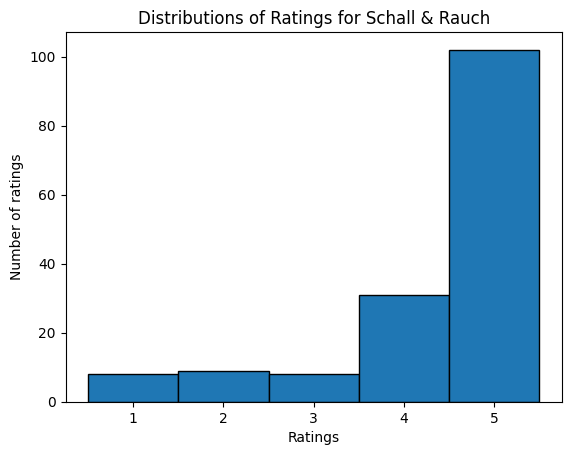

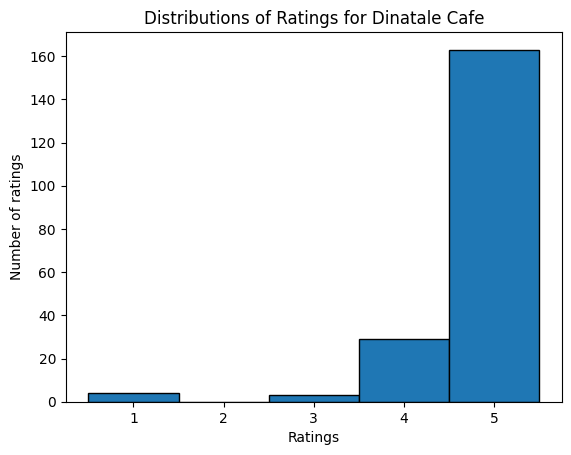

In [19]:
# visualising Ratings for each venue.
venues = reviews_df['name'].unique()

for venue in venues:
    subset = reviews_df[reviews_df['name'] == venue]
    
    bins = [ 0.5, 1.5, 2.5, 3.5, 4.5, 5.5]
    
    plt.hist(subset['bert_ratings'], bins = bins, edgecolor = 'k', align = 'mid')
    plt.xticks([ 1, 2, 3, 4, 5])
    plt.xlabel('Ratings')
    plt.ylabel('Number of ratings')
    plt.title(f'Distributions of Ratings for {venue}')
    plt.show()

In [20]:
reviews_df

,index,name,rating,author_title,review_text,review_rating,date,language,bert_ratings
0,0,Lost Weekend,4.4,Lucas Gahn,das café ist super und sehr stilvoll eingerich...,5.0,2023-10-09,de,5
1,1,Lost Weekend,4.4,Susanne Kosch,und jetzt mal halblang. könnte auch ein motto ...,5.0,2023-10-09,de,2
2,2,Lost Weekend,4.4,sahar sajedi,wässriger kaffee. nichts für nicht veganer.,2.0,2023-10-04,de,4
3,3,Lost Weekend,4.4,Canberk,great place to study all day and drink some go...,5.0,2023-09-28,en,5
4,5,Lost Weekend,4.4,Ella H,überfülltes studentencafe. nettes ambiente abe...,4.0,2023-09-20,de,3
...,...,...,...,...,...,...,...,...,...
3018,3150,Dinatale Cafe,4.7,Susanne S.,best coffee in town. best staff in town. simpl...,5.0,2019-06-26,en,5
3019,3151,Dinatale Cafe,4.7,Vincent Vogt,dolce vita at its best. a must stop for coffee..!,5.0,2019-06-16,en,5
3020,3152,Dinatale Cafe,4.7,Vaiva Tepe,very good cappuccino!,5.0,2019-06-16,it,5
3021,3153,Dinatale Cafe,4.7,Andy Baumann,"einfach herrlich "",italienisch"" ...",5.0,2019-06-10,de,5


In [29]:
reviews_df['date'] = pd.to_datetime(reviews_df['date'], format='%Y-%m-%d')


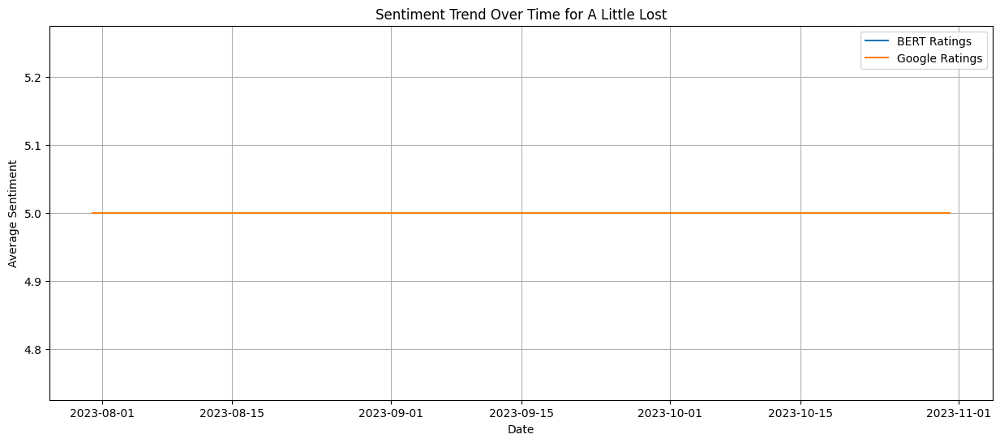

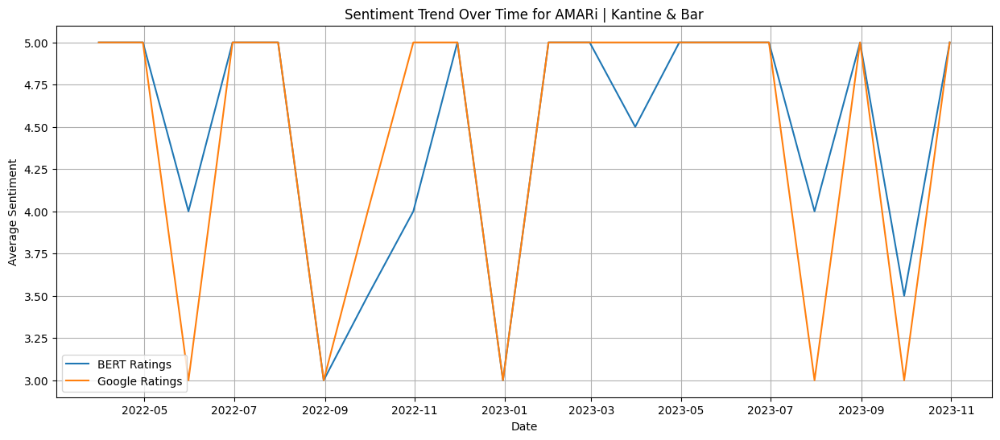

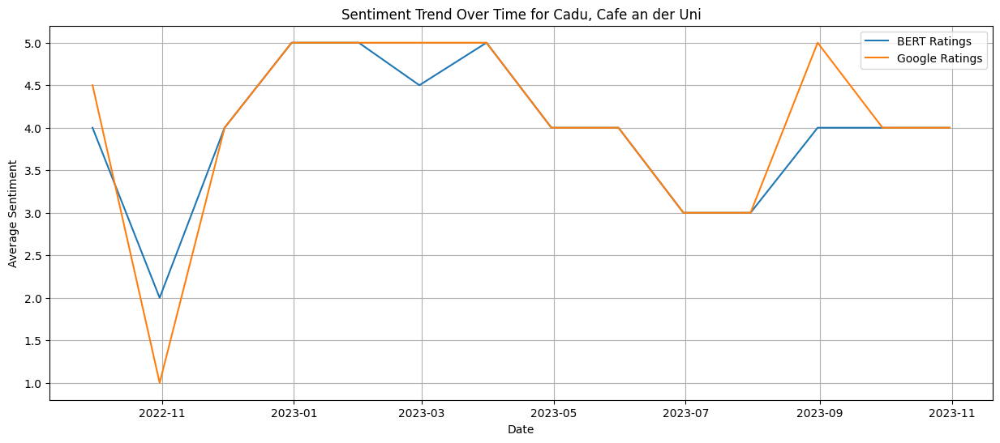

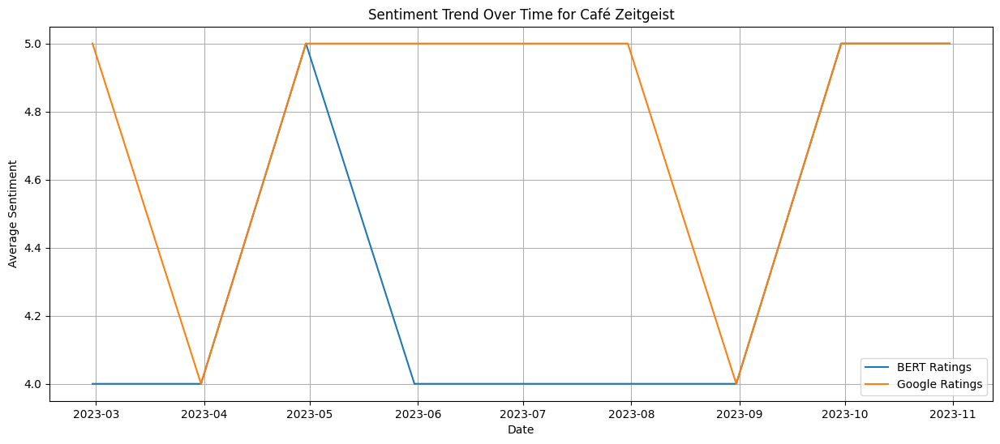

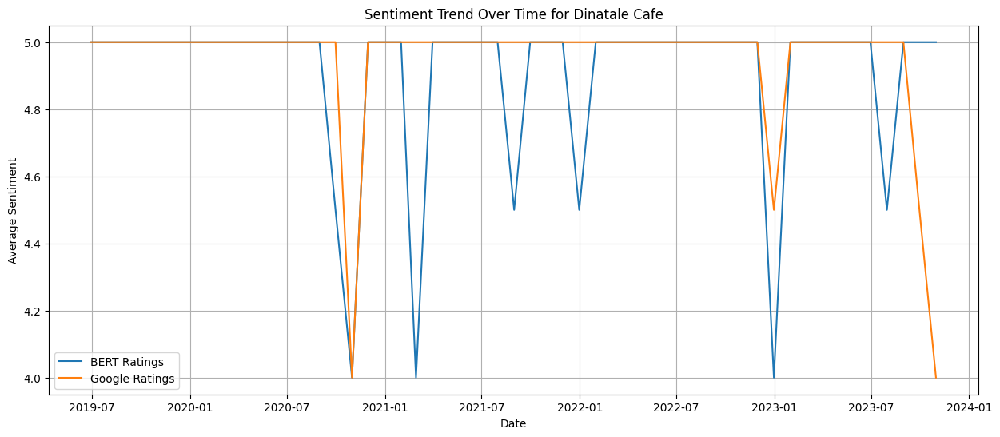

...

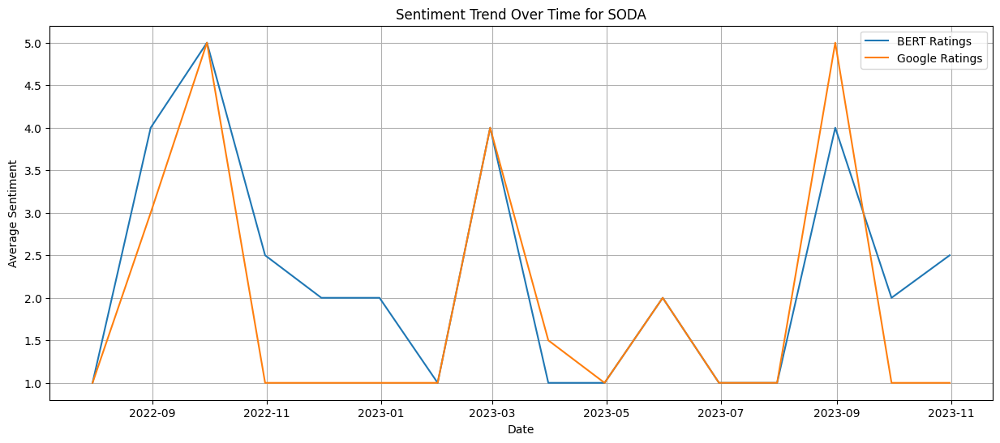

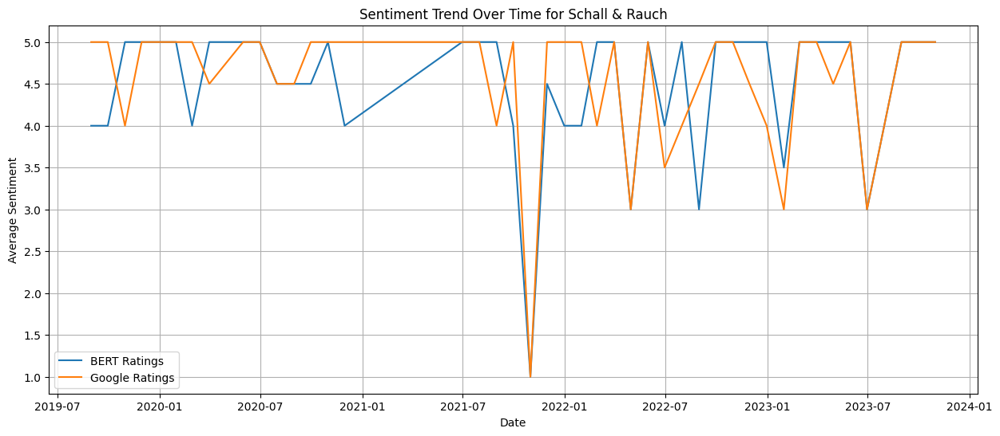

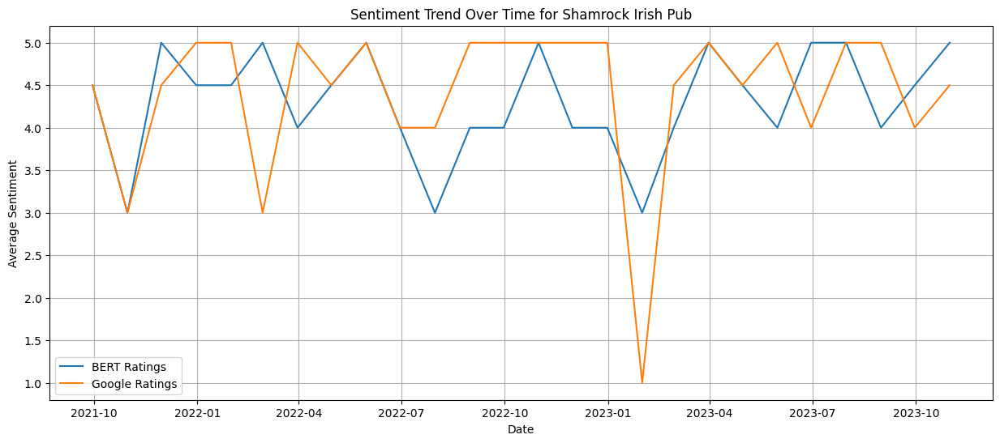

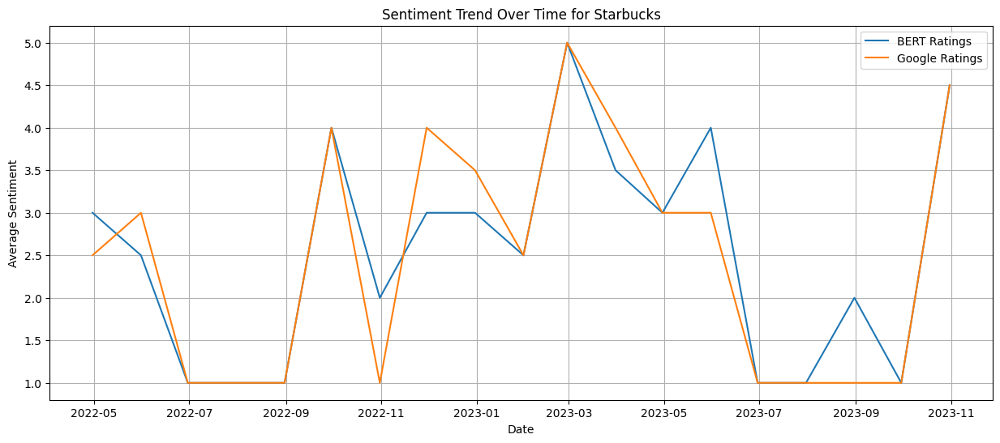

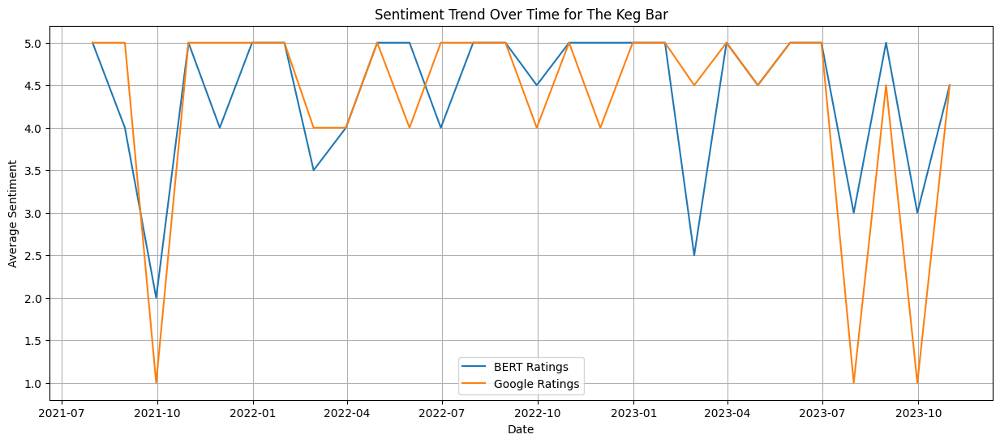

In [48]:
# next I want to see the distribution of the bert_ratings and google reviews over time 
# grouping the venues and dates by weekly
grouped = reviews_df.groupby(['name'])
grouped_weekly = grouped.resample('M', on = 'date').agg({
    'bert_ratings' : 'median',
    'review_rating' : 'median'
}).reset_index()

venues = grouped_weekly['name'].unique()

for venue in venues:
    
    subset_df = grouped_weekly[grouped_weekly['name'] == venue]

    plt.figure(figsize=(15,6))
    # plotting the bert_ratings
    sns.lineplot(data = subset_df, x = 'date', y = 'bert_ratings', label = 'BERT Ratings')
    # plotting the google ratings
    sns.lineplot(data = subset_df, x = 'date', y = 'review_rating', label = 'Google Ratings')
    plt.title(f'Sentiment Trend Over Time for {venue}')
    plt.xlabel('Date')
    plt.ylabel('Average Sentiment')
    plt.grid(True)
    plt.show()

## BERT Results

- BERT seems to do a good job at catching the sentiment of each review with similar results to the stars given by the person
- Ive seen a instances of the model gave 1 star while the reviewer gave 5 which upon inspection maybe due to review length being too long.
- the drawback is that the model gives the sentiment in star ratings while we also have the google ratings from the user

In [31]:
reviews_df

,index,name,rating,author_title,review_text,review_rating,date,language,bert_ratings
0,0,Lost Weekend,4.4,Lucas Gahn,das café ist super und sehr stilvoll eingerich...,5.0,2023-10-09,de,5
1,1,Lost Weekend,4.4,Susanne Kosch,und jetzt mal halblang. könnte auch ein motto ...,5.0,2023-10-09,de,2
2,2,Lost Weekend,4.4,sahar sajedi,wässriger kaffee. nichts für nicht veganer.,2.0,2023-10-04,de,4
3,3,Lost Weekend,4.4,Canberk,great place to study all day and drink some go...,5.0,2023-09-28,en,5
4,5,Lost Weekend,4.4,Ella H,überfülltes studentencafe. nettes ambiente abe...,4.0,2023-09-20,de,3
...,...,...,...,...,...,...,...,...,...
3018,3150,Dinatale Cafe,4.7,Susanne S.,best coffee in town. best staff in town. simpl...,5.0,2019-06-26,en,5
3019,3151,Dinatale Cafe,4.7,Vincent Vogt,dolce vita at its best. a must stop for coffee..!,5.0,2019-06-16,en,5
3020,3152,Dinatale Cafe,4.7,Vaiva Tepe,very good cappuccino!,5.0,2019-06-16,it,5
3021,3153,Dinatale Cafe,4.7,Andy Baumann,"einfach herrlich "",italienisch"" ...",5.0,2019-06-10,de,5


In [32]:
en_de = reviews_df[reviews_df['language'].isin(['en', 'de'])]

In [33]:
import spacy

nlp_en = spacy.load('en_core_web_sm')
nlp_de = spacy.load('de_core_news_sm')


In [34]:
# defining a function to categorize the reviews so i can filter by positive, neutral and negative.
def categorize_sentiment(rating):
    if 0 <= rating <= 1:
        return'negative'
    elif rating == 2:
        return 'neutral'
    else:
        return 'positive'

# apply the function
en_de['sentiment_category'] = en_de['bert_ratings'].progress_apply(categorize_sentiment)

100%|██████████████████████████████████| 2896/2896 [00:00<00:00, 1087050.69it/s]
/var/folders/hm/lc2tr7v957lgz2xk_p_fhct40000gn/T/ipykernel_64638/2618225229.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  en_de['sentiment_category'] = en_de['bert_ratings'].progress_apply(categorize_sentiment)


In [35]:
# I need to tokenize my text before removing stop words to get best results.
def tokenize(row):
    text = row['review_text']
    lang = row['language']
    
    if lang == 'en':
        doc = nlp_en(text)
    elif lang == 'de':
        doc = nlp_de(text)
    else:
        return text.split()
    
    return [token.text for token in doc]

In [36]:
en_de['review_text'] = en_de.progress_apply(tokenize, axis = 1)

100%|██████████████████████████████████████| 2896/2896 [00:13<00:00, 222.17it/s]
/var/folders/hm/lc2tr7v957lgz2xk_p_fhct40000gn/T/ipykernel_64638/3297155612.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  en_de['review_text'] = en_de.progress_apply(tokenize, axis = 1)


In [37]:
#saving so i can compare with and without stop-words and lemmatiztion
en_de.to_csv('review_data/en_de_bwsl.csv', index = False)

In [38]:
# Fine-tuning word clouds by removing common words that dont add to word cloud

# Words in English to remove
english_stopwords_to_add = ["coffee", "place", "order"]
for word in english_stopwords_to_add:
    nlp_en.Defaults.stop_words.add(word)
    nlp_en.vocab[word].is_stop = True

# Words in German to remove
german_stopwords_to_add = ["kaffee", "mal"]
for word in german_stopwords_to_add:
    nlp_de.Defaults.stop_words.add(word)
    nlp_de.vocab[word].is_stop = True


# using spacy to remove stop words ill use a similar function as above to do this.
def remove_stopwords(tokens, lang):
    if lang == 'en':
        stop_words = nlp_en.Defaults.stop_words
    elif lang == 'de':
        stop_words = nlp_de.Defaults.stop_words
    else:
        return tokens
    
    return [token for token in tokens if token not in stop_words]

In [39]:
en_de['review_text'] = en_de.progress_apply(
    lambda row: remove_stopwords(
        row['review_text'].split() if isinstance(row['review_text'], str) else row['review_text'], 
        row['language']), 
    axis=1)

100%|████████████████████████████████████| 2896/2896 [00:00<00:00, 84829.28it/s]
/var/folders/hm/lc2tr7v957lgz2xk_p_fhct40000gn/T/ipykernel_64638/4197029575.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  en_de['review_text'] = en_de.progress_apply(


In [40]:
# Lemmatizing the words down to their base root for word cloud.
def lemmatize(tokens, lang):
    if lang == 'en':
        nlp = nlp_en
    elif lang == 'de':
        nlp = nlp_de
    else:
        return tokens 
    
    # Convert the list of tokens back to text
    text = ' '.join(tokens)
    doc = nlp(text)
    
    # Extract lemmas for each token and return
    return [token.lemma_ for token in doc]

In [41]:
#Calling the lemmatize function
en_de['review_text'] = en_de.progress_apply(
    lambda row: lemmatize(
        row['review_text'].split() if isinstance(row['review_text'], str) else row['review_text'], 
        row['language']), 
    axis=1)

100%|██████████████████████████████████████| 2896/2896 [00:09<00:00, 292.12it/s]
/var/folders/hm/lc2tr7v957lgz2xk_p_fhct40000gn/T/ipykernel_64638/3890627529.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  en_de['review_text'] = en_de.progress_apply(


In [42]:
#saving so i can compare with and without stop-words and lemmatiztion
en_de.to_csv('review_data/en_de_bsl.csv', index = False)

In [43]:
negative_reviews = en_de[en_de['sentiment_category'] == 'negative']['review_text']
neutral_reviews = en_de[en_de['sentiment_category'] == 'neutral']['review_text']
positive_reviews = en_de[en_de['sentiment_category'] == 'positive']['review_text']

In [44]:
positive_text = ' '.join([' '.join(review) for review in positive_reviews])
neutral_text = ' '.join([' '.join(review) for review in neutral_reviews])
negative_text = ' '.join([' '.join(review) for review in negative_reviews])


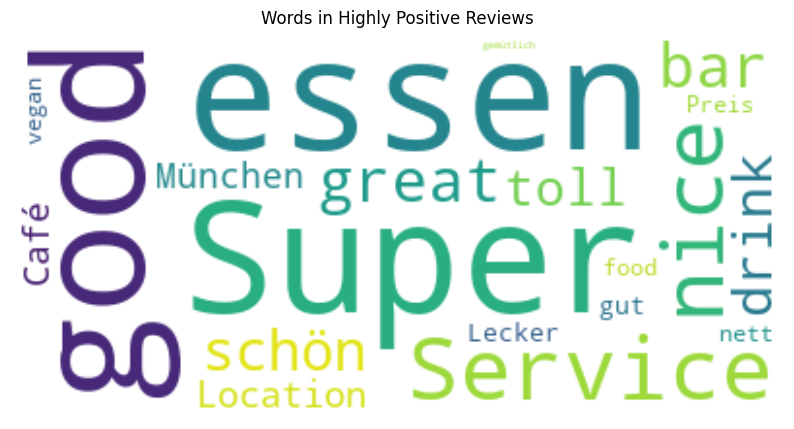

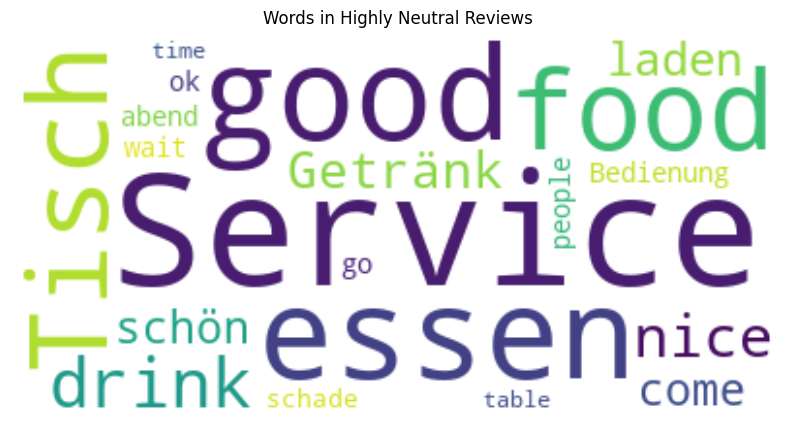

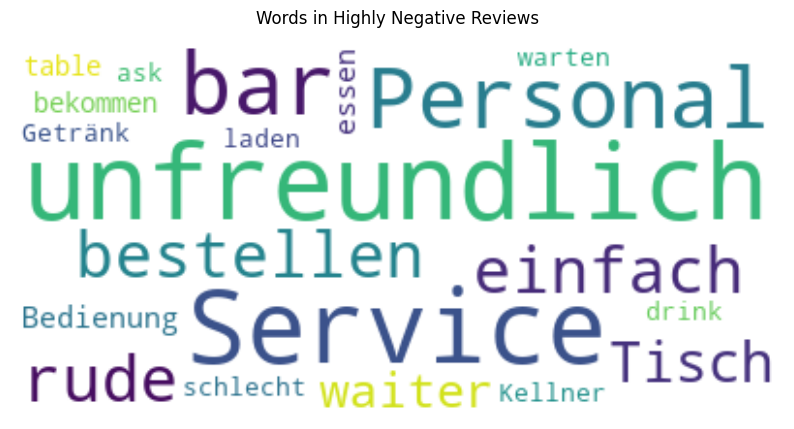

In [45]:
#general word cloud for all venues.
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_wordcloud(text, title):
    wordcloud = WordCloud(max_font_size=80,
                          max_words=20,
                          background_color="white",
                          colormap = 'viridis',
                          
                          prefer_horizontal = 0.9,
                          margin = 10).generate(text)
    
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title)
    plt.show()

# Generate word clouds
generate_wordcloud(positive_text, "Words in Highly Positive Reviews")
generate_wordcloud(neutral_text, "Words in Highly Neutral Reviews")
generate_wordcloud(negative_text, "Words in Highly Negative Reviews")

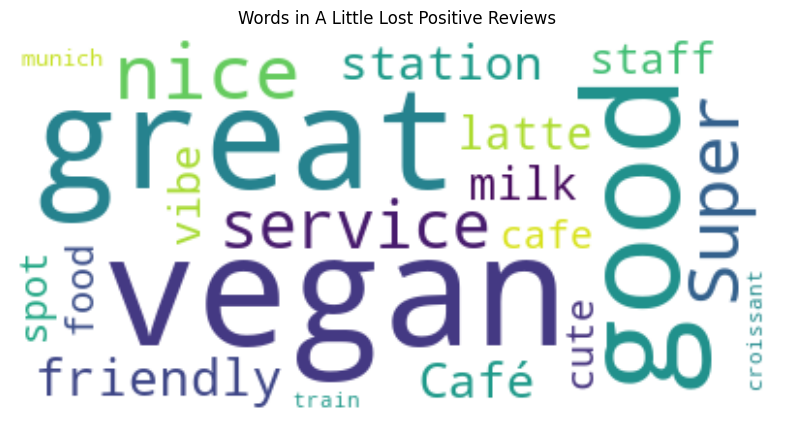

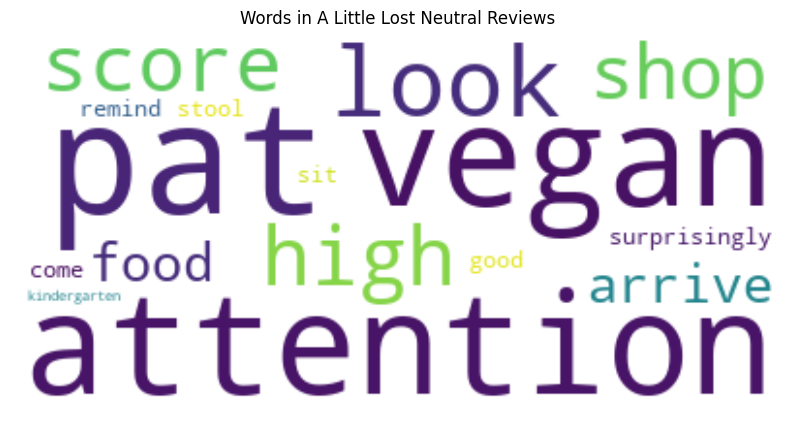

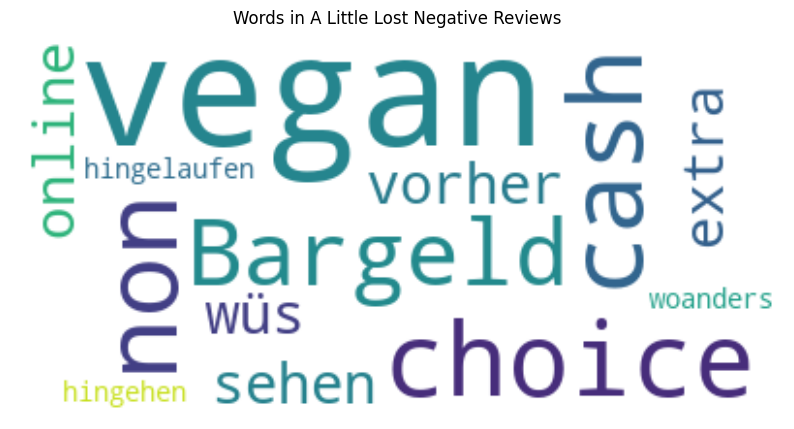

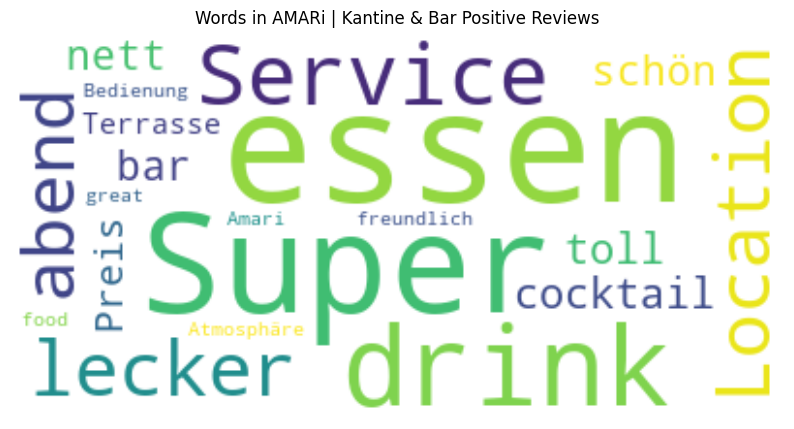

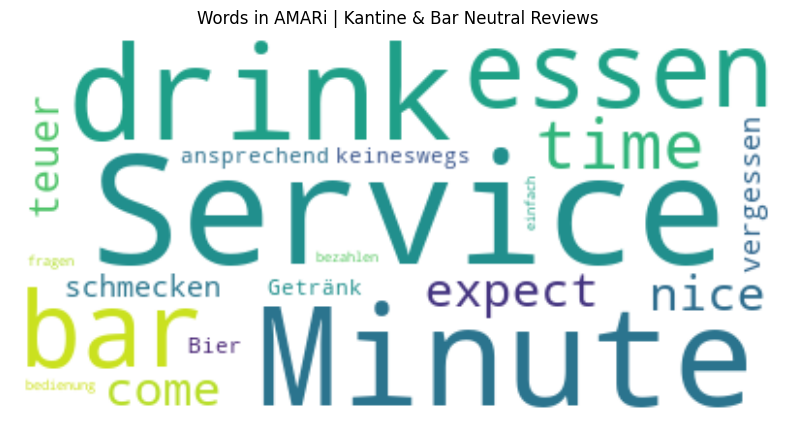

...

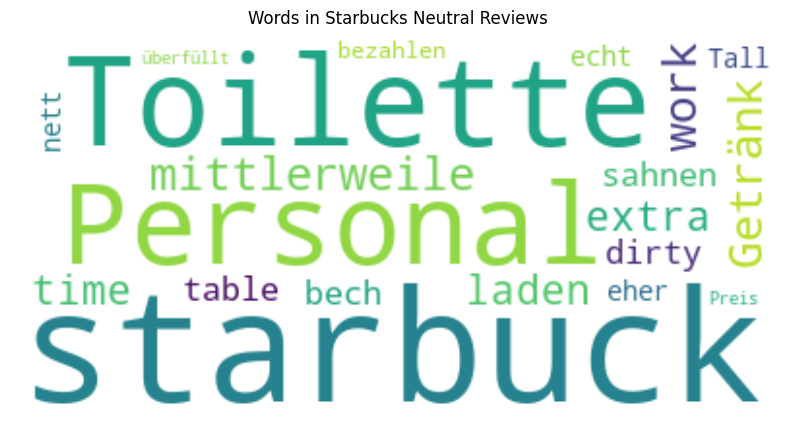

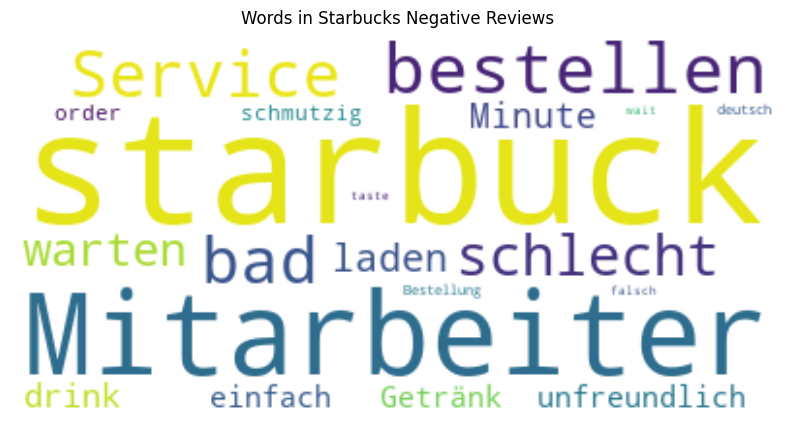

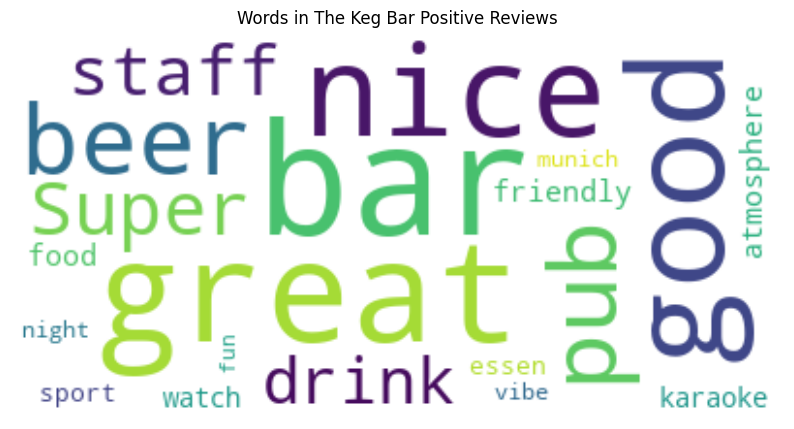

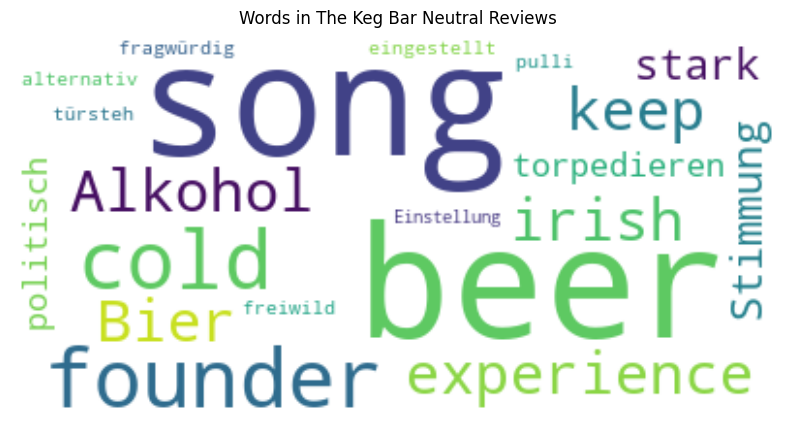

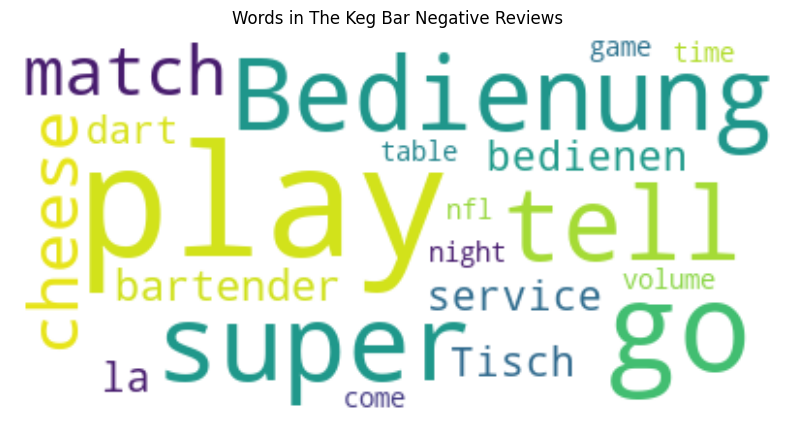

In [46]:
# Group by venue
grouped = en_de.groupby('name')  # Assuming 'name' is the column with the venue names.

# For storing combined texts for each sentiment for each venue
venue_positive_texts = {}
venue_neutral_texts = {}
venue_negative_texts = {}

# Loop over each venue group
for venue_name, group in grouped:
    # Filter reviews based on sentiment 
    negative_reviews = group[group['sentiment_category'] == 'negative']['review_text']
    neutral_reviews = group[group['sentiment_category'] == 'neutral']['review_text']
    positive_reviews = group[group['sentiment_category'] == 'positive']['review_text']
    
    # Generate the combined text for each sentiment category for the current venue
    venue_positive_texts[venue_name] = ' '.join([' '.join(review) for review in positive_reviews])
    venue_neutral_texts[venue_name] = ' '.join([' '.join(review) for review in neutral_reviews])
    venue_negative_texts[venue_name] = ' '.join([' '.join(review) for review in negative_reviews])

    # Optionally, generate word clouds for each venue and sentiment
    if venue_positive_texts[venue_name]:
        generate_wordcloud(venue_positive_texts[venue_name], f"Words in {venue_name} Positive Reviews")
    if venue_neutral_texts[venue_name]:
        generate_wordcloud(venue_neutral_texts[venue_name], f"Words in {venue_name} Neutral Reviews")
    if venue_negative_texts[venue_name]:
        generate_wordcloud(venue_negative_texts[venue_name], f"Words in {venue_name} Negative Reviews")
